# Import and set colors

In [1]:
#Import packages
import scanpy as sc
import anndata as ann
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import cm, colors
from gprofiler import gprofiler

import os 

import seaborn as sb

In [2]:
plt.rcParams['figure.figsize']=(4,3) #rescale figures
sc.settings.verbosity = 3
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=300,transparent=False, fontsize=12, color_map='plasma')
sc.logging.print_header()

scanpy==1.7.1 anndata==0.7.6 umap==0.5.1 numpy==1.21.2 scipy==1.8.1 pandas==1.2.3 scikit-learn==0.24.1 statsmodels==0.12.2 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3 pynndescent==0.5.4


In [3]:
#Define a nice colour map for gene expression
colors2 = plt.cm.plasma(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap2 = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

# Set project file paths

In [4]:
file_path = '/Volumes/Seagate_Exp/Paper_sc_analysis/' 
#this is my file path please adapt it to your directory

In [5]:
data_dir = '/Volumes/Seagate_Exp/Paper_sc_analysis/notebooks/analysis_early_time_points/040522_corrected_notebooks/data_scVI/' 

In [6]:
table_dir = file_path + 'tables_earlytp/'

In [7]:
sc.settings.figdir = file_path + 'figures_earlytp/'

In [8]:
import datetime

today = datetime.date.today().strftime('%y%m%d') #creates a YYMMDD string of today's date

# Read Data & downstream analysis

In [9]:
adata_postnorm = sc.read('/Volumes/Seagate_Exp/Paper_sc_analysis/notebooks/analysis_early_time_points/040522_corrected_notebooks/data_scVI/adata_postnorm_no13_scvi_mde.h5ad')

## Select Intact and injury samples

In [10]:
adata_ctr_proc = adata_postnorm[np.in1d(adata_postnorm.obs['condition'], 
                           ['3dpi_V', '5dpi_V', 'Intact'])].copy()

In [11]:
adata_ctr_proc.obs['condition'].value_counts()

Intact    16650
5dpi_V    15156
3dpi_V     3643
Name: condition, dtype: int64

In [12]:
adata_ctr_proc = adata_ctr_proc[~np.in1d(adata_ctr_proc.obs['leiden'], #remove cluster 13 only drom one batch multiple identity
                           ['13'])].copy()

In [13]:
adata_ctr_proc

AnnData object with n_obs × n_vars = 34058 × 19290
    obs: 'sample_id', 'sample_id_str', 'condition', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'n_counts', 'n_genes', 'doublet_score', 'doublet', 'sample', 'experiment', 'size_factors', 'leiden', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'batch_colors', 'condition_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_id_str_colors', 'umap'
    obsm: 'X_mde', 'X_pca', 'X_scVI', 'X_umap'
    varm: 'PCs'
    layers: 'coun

In [14]:
adata_ctr_proc_2=adata_ctr_proc.copy()

#### reconsider doublets

In [15]:
thr = 0.04
ix_filt = adata_ctr_proc_2.obs['doublet_score']<=thr

adata_ctr_proc_2 = adata_ctr_proc_2[ix_filt].copy()
print('Number of cells after doublet filter: {:d}'.format(adata_ctr_proc_2.n_obs))

Number of cells after doublet filter: 33862


In [16]:
# use scVI latent space for UMAP generation
sc.pp.neighbors(adata_ctr_proc_2, use_rep="X_scVI")


computing neighbors


OMP: Info #271: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:07)


In [17]:
sc.tl.umap(adata_ctr_proc_2)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:18)


In [18]:
sc.tl.leiden(adata_ctr_proc_2, key_added="leiden_scVI")

running Leiden clustering
    finished: found 35 clusters and added
    'leiden_scVI', the cluster labels (adata.obs, categorical) (0:00:05)


In [19]:
sc.tl.leiden(adata_ctr_proc_2, key_added="leiden_scVI2", resolution=2)

running Leiden clustering
    finished: found 50 clusters and added
    'leiden_scVI2', the cluster labels (adata.obs, categorical) (0:00:06)


In [20]:
sc.tl.leiden(adata_ctr_proc_2, key_added="leiden_scVI05", resolution=0.5)

running Leiden clustering
    finished: found 26 clusters and added
    'leiden_scVI05', the cluster labels (adata.obs, categorical) (0:00:03)


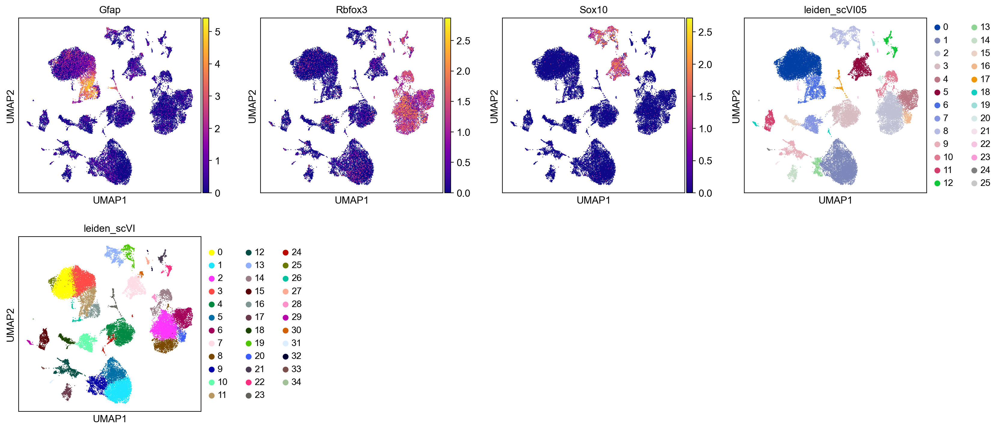

In [21]:
sc.pl.umap(adata_ctr_proc_2, color=['Gfap','Rbfox3','Sox10','leiden_scVI05','leiden_scVI'], )

In [22]:
print(adata_ctr_proc_2.obs['condition'].value_counts())

Intact    16567
5dpi_V    13658
3dpi_V     3637
Name: condition, dtype: int64


In [23]:
intact_subsam = sc.pp.subsample(adata_ctr_proc_2[adata_ctr_proc_2.obs['condition']=='Intact'],n_obs=3637,copy=True).obs_names
five_dpi_V_subsam = sc.pp.subsample(adata_ctr_proc_2[adata_ctr_proc_2.obs['condition']=='5dpi_V'],n_obs=3637,copy=True).obs_names
three_dpi_V_subsam = sc.pp.subsample(adata_ctr_proc_2[adata_ctr_proc_2.obs['condition']=='3dpi_V'],n_obs=3637,copy=True).obs_names
adata_ctr_proc_2_subsam = adata_ctr_proc_2[list(intact_subsam) + list(five_dpi_V_subsam)+list(three_dpi_V_subsam)].copy()

In [24]:
sc.tl.embedding_density(adata_ctr_proc_2_subsam, basis='umap', groupby='condition')

computing density on 'umap'
--> added
    'umap_density_condition', densities (adata.obs)
    'umap_density_condition_params', parameter (adata.uns)


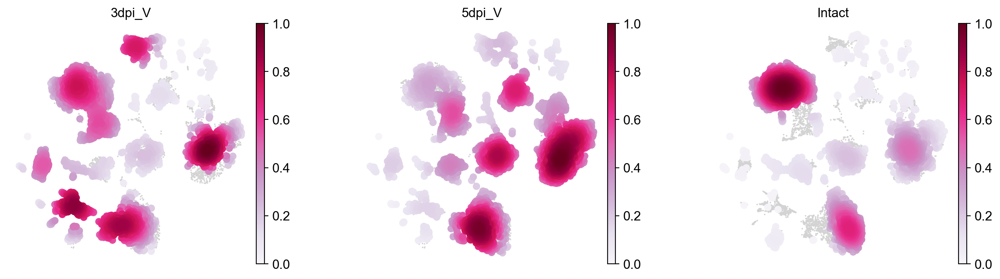

In [25]:
sc.pl.embedding_density(adata_ctr_proc_2_subsam, basis='umap',  key='umap_density_condition', color_map='PuRd', wspace=0.3, bg_dotsize = 8, frameon= False, ncols=5, save='_distribution_downscaling_ctr.png')

In [26]:
con_cl= ['#DC143C', '#ff9933','#20B2AA']

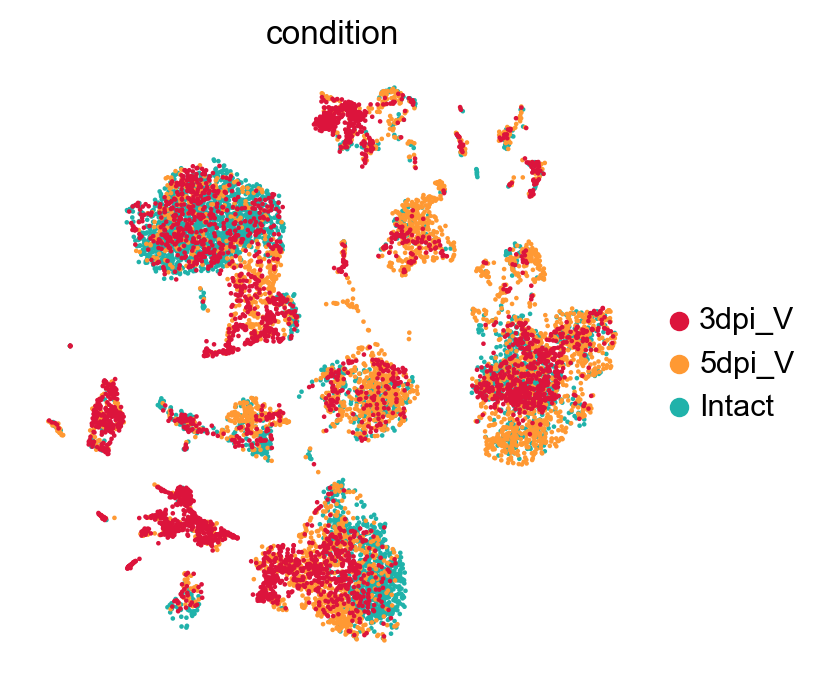

In [27]:
sc.pl.umap(adata_ctr_proc_2_subsam,color='condition',palette=con_cl, legend_fontweight= 'normal', frameon= False ,)

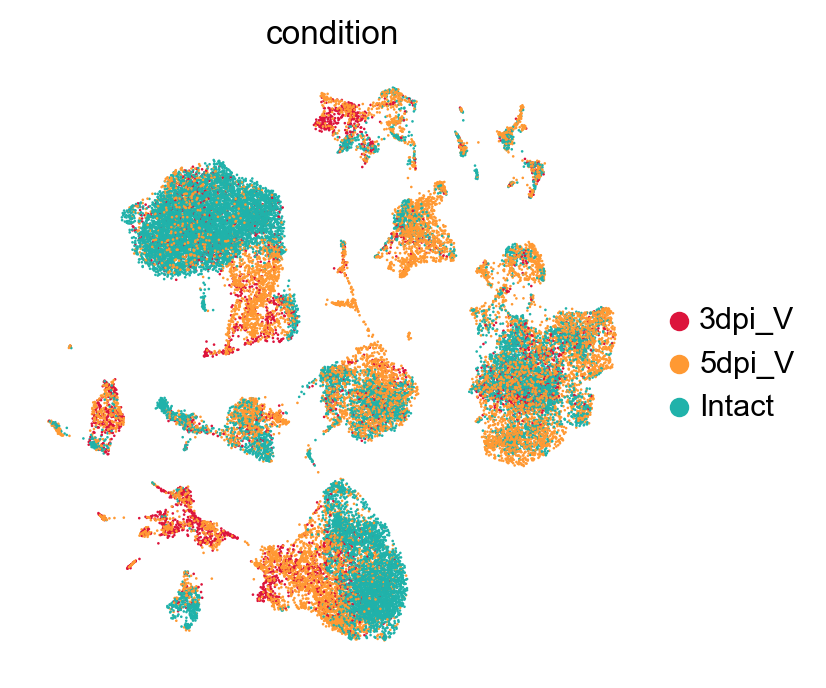

In [28]:
sc.pl.umap(adata_ctr_proc_2,color='condition',palette=con_cl, legend_fontweight= 'normal', frameon= False ,)

## Cell cycle

In [29]:
cell_cycle_genes = [x.strip() for x in open('/Volumes/Seagate_Exp/Single_cell_112020/regev_lab_cell_cycle_genes_mouse.txt')]

In [30]:
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata_ctr_proc_2.var_names]

In [31]:
sc.tl.score_genes_cell_cycle(adata_ctr_proc_2, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    685 total control genes are used. (0:00:01)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    769 total control genes are used. (0:00:01)
-->     'phase', cell cycle phase (adata.obs)


In [32]:
pair2= ["#009B77", "#ff8080", "#ffbf00", "#9AD255", "#9AD255",
       "#b30047",   "#dada2b", "#dada2b"]

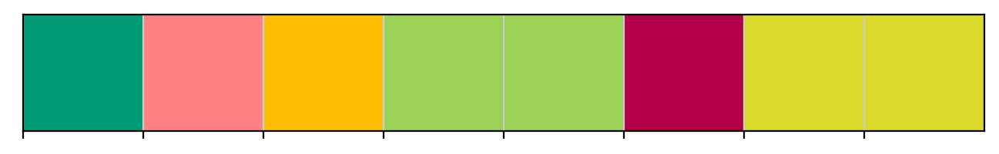

In [33]:
sb.palplot(pair2)

... storing 'phase' as categorical


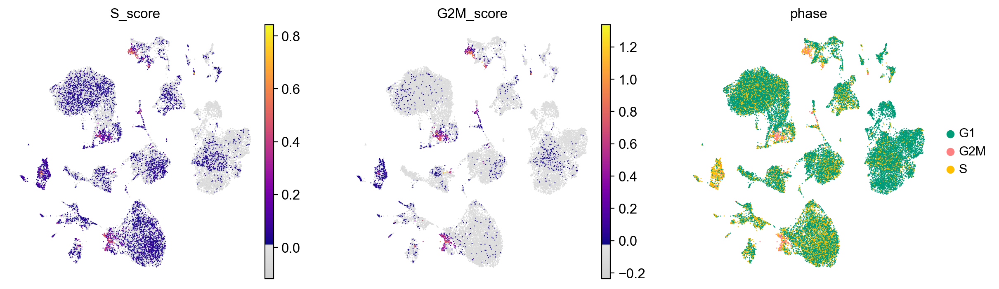

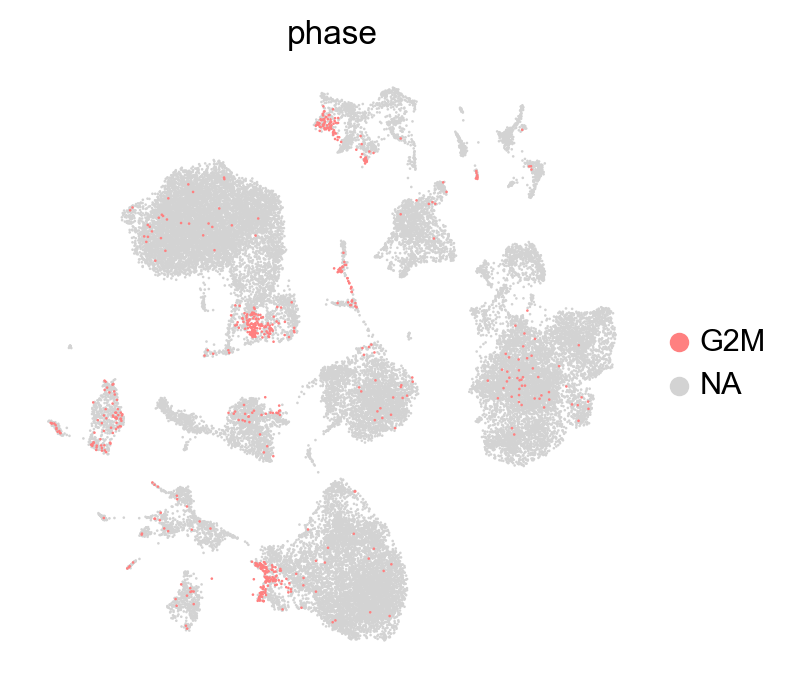

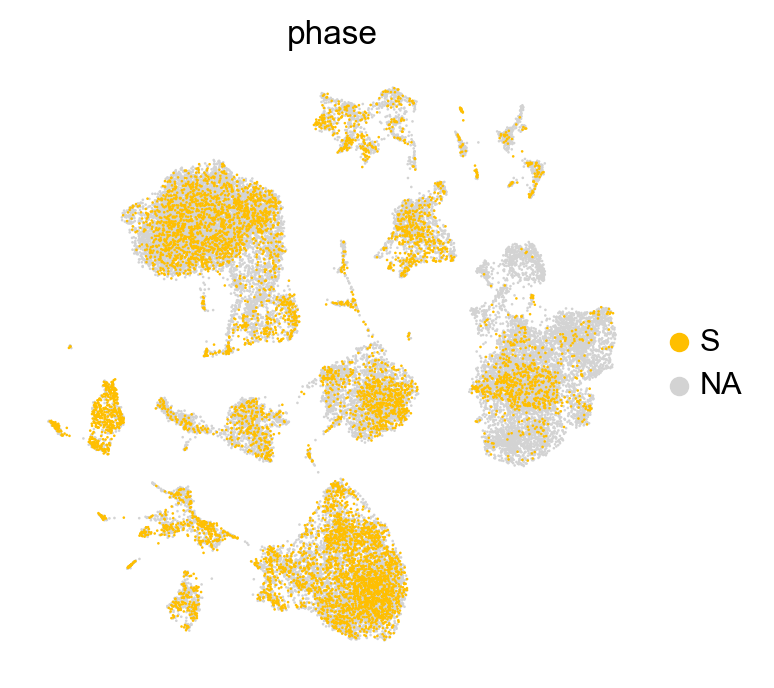

In [34]:
sc.pl.umap(adata_ctr_proc_2, color=['S_score', 'G2M_score', 'phase'],palette=pair2, use_raw=False, frameon=False, cmap=mymap2)
sc.pl.umap(adata_ctr_proc_2, color='phase',groups=['G2M'],  palette=pair2, use_raw=False, frameon=False)
sc.pl.umap(adata_ctr_proc_2, color='phase',groups=['S'],  palette=pair2, use_raw=False, frameon=False)

In [35]:
sc.tl.score_genes(adata_ctr_proc_2, list(cell_cycle_genes), score_name='Cycling cells' )

computing score 'Cycling cells'
    finished: added
    'Cycling cells', score of gene set (adata.obs).
    992 total control genes are used. (0:00:01)


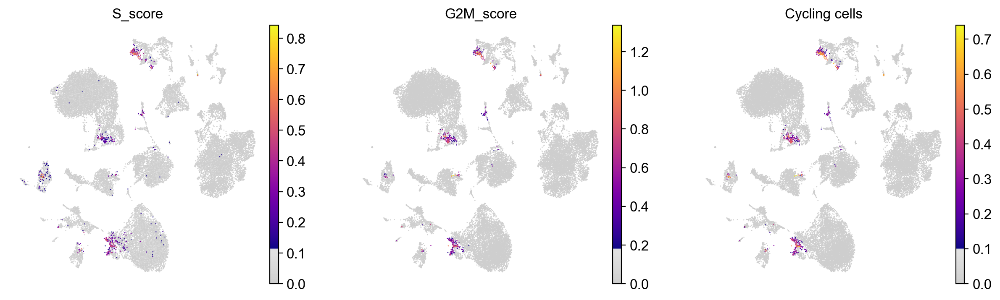

In [36]:
sc.pl.umap(adata_ctr_proc_2, color=['S_score', 'G2M_score', 'Cycling cells'],palette=pair2, use_raw=False, frameon=False, cmap=mymap2, vmin=0)

In [37]:
Ccc = adata_ctr_proc_2.obs['Cycling cells'] >0

In [38]:
Ccc

AAACCCACAACAGCTT    False
AAACCCACAGCGACCT    False
AAACCCATCCACCTCA    False
AAACCCATCCATCGTC    False
AAACCCATCTGAGAGG    False
                    ...  
TTTGTCATCACAATGC    False
TTTGTCATCCAACCAA    False
TTTGTCATCCTTGGTC    False
TTTGTCATCGATCCCT    False
TTTGTCATCTTGAGAC    False
Name: Cycling cells, Length: 33862, dtype: bool

In [39]:
adata_ctr_proc_2.obs['Cycling_cells'] = Ccc
adata_ctr_proc_2.obs['Cycling_cells'] = adata_ctr_proc_2.obs['Cycling_cells'].astype('category')

In [40]:
cluster2annotation = {
    False : 'resting',
    True : 'cycling',
 }

In [41]:
adata_ctr_proc_2.obs['Cycling_cells'] = adata_ctr_proc_2.obs['Cycling_cells'].map(cluster2annotation).astype('category')

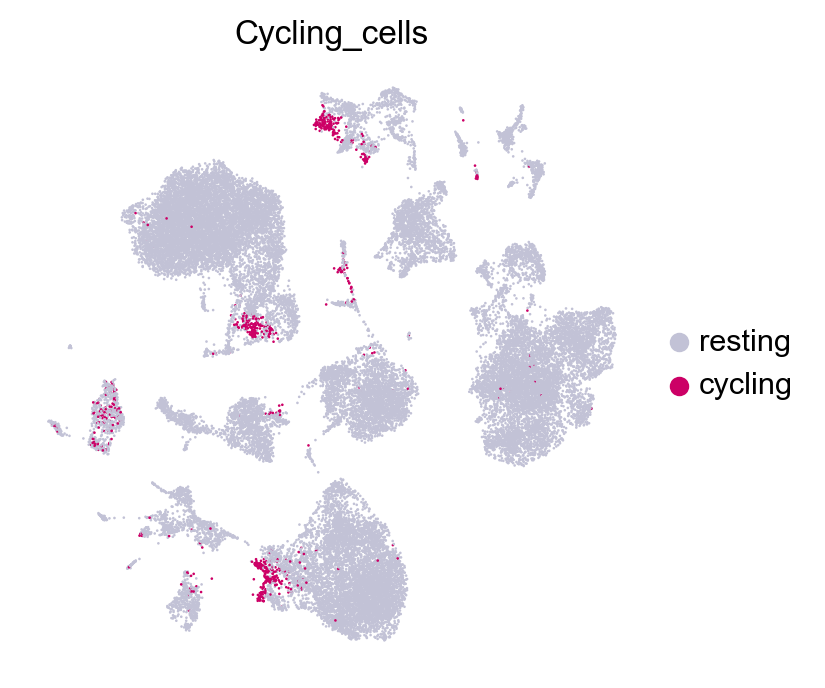

In [42]:
sc.pl.umap(adata_ctr_proc_2, color=['Cycling_cells'],palette=['#c2c2d6', '#cc0066'], use_raw=False, frameon=False, cmap=mymap2, vmin=0)

# Markers analysis

In [43]:
Markers_all_cells ={'Microglia': ['Tmem119', 'Cx3cr1', 'P2ry12', 'P2ry13', 'Gpr34', 'Olfml3', 'Selplg', 'Sparc', 'Fcrls', 'Siglech', 'Slc2a5','Mafb', 'Pmepa1', 'Cd14'],
                   'DAM':['Lpl','Cst7'], 
                   'Macrophages':['Itga4', 'Tgfbi', 'Ifitm2', 'Ifitm3', 'Tagln2','F13a1', 'Kynu', 'S100a11', 'S100a6'],
                   'BAM': [ 'Cd163', 'Mrc1','Lyve1', 'Siglec1'],
                   'Monocytes':['Ly6c2','Ccr2','Spn'],
                   'DCs':['Cd24a','Itgax','Bst2','Cd209a','Xcr1','Ccr7','Ccr9', 'Flt3','Itgae', 'Itgam','H2-Oa','Tnni2','Kctd14','Amica1','Kmo','Hepacam2'], 
                   'NKT cells':['Cd3e','Klrb1c','Ncr1'],
                   'T cells':['Cd3d','Cd3e','Cd3g','Lat','Bcl11b'],
                   'B cells':['Cd19', 'Ms4a1', 'Sdc1', 'Pax5', 'Ms4a1'],
                   'Neutrophils': ['S100a9'],
                   'Neurons':['Rbfox3','Slc17a7','Gabra1', 'Cux1','Pou3f2','Bcl11b', 'Foxp2'],
                   'OPCs':['Pdgfra', 'C1ql1'],
                   'COPs':['Neu4', 'Brca1'],
                   'MOL':['Opalin', 'Ninj2'],
                   'Astrocytes':['Sox9', 'Gfap','Aldh1l1','Atp1b2', 'Vim','Gfap','Slc1a3','Aldoc'],
                   'Pericytes':['Pecam1','Pdgfrb', 'Higd1b','Ndufa4l2','Rgs5','Kcnj8','Flt1'],
                   'VSMCs':['Acta2', 'Tagln','Myh11', 'Mustn1','Map3k7cl'],
                   'VLMCs':['Mgp', 'Slc47a1',  'Thbd', 'Col1a1', 'Col1a2'],
                   'VECV': ['Ly6c1','Cldn5', 'Ly6a','Pltp','Pglyrp1', 'Scgb3a1']
                  }#Ochocka et al., 2021, van Hove et al., 2016, Zeisel et al. 2018

In [44]:
for names in list(Markers_all_cells):
 sc.tl.score_genes(adata_ctr_proc_2, Markers_all_cells[names], score_name=names )

computing score 'Microglia'
    finished: added
    'Microglia', score of gene set (adata.obs).
    250 total control genes are used. (0:00:01)
computing score 'DAM'
    finished: added
    'DAM', score of gene set (adata.obs).
    100 total control genes are used. (0:00:01)
computing score 'Macrophages'
    finished: added
    'Macrophages', score of gene set (adata.obs).
    350 total control genes are used. (0:00:01)
computing score 'BAM'
    finished: added
    'BAM', score of gene set (adata.obs).
    150 total control genes are used. (0:00:01)
computing score 'Monocytes'
    finished: added
    'Monocytes', score of gene set (adata.obs).
    150 total control genes are used. (0:00:01)
computing score 'DCs'
    finished: added
    'DCs', score of gene set (adata.obs).
    499 total control genes are used. (0:00:01)
computing score 'NKT cells'
    finished: added
    'NKT cells', score of gene set (adata.obs).
    100 total control genes are used. (0:00:01)
computing score 'T cells

In [45]:
sc.tl.rank_genes_groups(adata_ctr_proc_2, groupby='leiden_scVI', key_added='rank_genes_ctr_r1', method='t-test_overestim_var')

ranking genes
    finished: added to `.uns['rank_genes_ctr_r1']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:24)


    using 'X_pca' with n_pcs = 9
Storing dendrogram info using `.uns['dendrogram_leiden_scVI']`


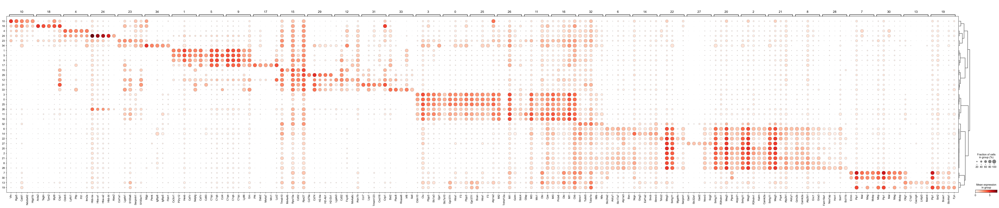

In [46]:
sc.pl.rank_genes_groups_dotplot(adata_ctr_proc_2, n_genes=5, key='rank_genes_ctr_r1' )

In [47]:
mg = []
scores = []
for i in range(0,35):
    mg = [j[i] for j in adata_ctr_proc_2.uns['rank_genes_ctr_r1']['names']][:100]
    scores = [j[i] for j in adata_ctr_proc_2.uns['rank_genes_ctr_r1']['scores']][:100]
    print('marker genes in louvain cluster: ' + str(i))
    for j in range (0,len(mg)):
        print(mg[j])
    print('-----------------')

marker genes in louvain cluster: 0
Slc7a10
Gpr37l1
Htra1
F3
Plpp3
Bcan
Aldoc
Ndrg2
Slc1a3
Ntsr2
Atp1a2
Gja1
Cxcl14
Cldn10
Gjb6
Msmo1
Mfge8
Mt3
Btbd17
Gm3764
S1pr1
Clu
Acsl3
Mt1
Pla2g7
Gstm5
Prdx6
Ptprz1
Kcnk1
Cspg5
Dclk1
Slc1a2
Gstm1
Acsbg1
Tril
Atp1b2
Luzp2
Fgfr3
Apoe
Mt2
Tlcd1
Nkain4
Ckb
Lsamp
Slc6a1
Mmd2
Fam107a
Malat1
Scg3
Phkg1
Enho
Sparcl1
Ttyh1
Prnp
Acsl6
Tspan7
Glul
Slc39a12
Appl2
Slc27a1
Cml1
Fjx1
Tubb2b
Hepacam
Cntfr
Slc6a11
Prex2
Slco1c1
Rorb
Chchd10
Slc38a3
Slc25a18
Agpat5
Slc4a4
Eva1a
Gnao1
Timp4
Hacd2
Macf1
Grin2c
Son
Tst
S100b
Ptn
Cadm1
Pmm1
Paqr7
Aqp4
Ntm
Mlc1
Gria2
Ddhd1
Vegfa
Pnisr
Lfng
Cpe
Entpd2
Fermt2
Prodh
Id4
-----------------
marker genes in louvain cluster: 1
Cx3cr1
P2ry12
Hexb
Csf1r
Selplg
Gpr34
C1qa
Tmem119
Siglech
Trem2
C1qc
C1qb
Laptm5
Ctss
Olfml3
Fcrls
Lpcat2
Vsir
Lgmn
Fcgr3
Rgs10
Unc93b1
Ctsd
Tyrobp
Fcer1g
Ly86
Mafb
Serinc3
Sparc
Marcks
P2ry13
Hpgds
Cd53
Ctsz
Ifngr1
Pld4
Aif1
Itgb5
Rnase4
Ptgs1
Grn
Rhob
Cyba
Rgs2
Jun
Tgfbr1
Cd68
Ltc4s
Ctsh
AF251705
Fam105

In [48]:
cluster2annotation = {'0': '0_Astrocytes',
                      '1': '1_Microglia',
                      '2': '2_Neurons',
                      '3': '3_Astrocytes',
                      '4': '4_VECV',
                      '5': '5_Microglia',
                      '6': '6_Neurons',
                      '7': '7_MOL',
                      '8': '8_Neurons',
                      '9': '9_Microglia',
                      '10': '10_Pericytes',
                      '11': '11_Astrocytes',
                      '12': '12_Monocytes',
                      '13': '13_OPCs',
                      '14': '14_Neurons',
                      '15': '15_NKT/T cells',
                      '16': '16_Astrocytes',
                      '17': '17_BAM',
                      '18': '18_VSMCs',
                      '19': '19_COPs',
                      '20': '20_Neurons',
                      '21': '21_Neurons',
                      '22': '22_Neurons',
                      '23': '23_VLMCs',
                      '24': '24_Erythrocytes',
                      '25': '25_Astrocytes',
                      '26': '26_Astrocytes',
                      '27': '27_Neurons', 
                      '28': '28_Neurons',
                      '29': '29_B cells',
                      '30': '30_MOL',
                      '31': '31_DC',
                      '32': '32_Neurons',
                      '33': '33_Monocytes',
                      '34': '34_VLMCs'
}

In [49]:
adata_ctr_proc_2.obs['annotated'] = adata_ctr_proc_2.obs['leiden_scVI'].map(cluster2annotation).astype('category')

In [50]:
adata_ctr_proc_2.obs['annotated'].value_counts()

0_Astrocytes       4389
1_Microglia        3733
2_Neurons          3468
3_Astrocytes       3293
4_VECV             2747
5_Microglia        1960
6_Neurons          1494
7_MOL              1377
8_Neurons          1253
9_Microglia        1131
10_Pericytes       1130
11_Astrocytes      1110
12_Monocytes        807
13_OPCs             728
14_Neurons          708
15_NKT/T cells      584
16_Astrocytes       533
17_BAM              412
18_VSMCs            406
19_COPs             401
20_Neurons          305
21_Neurons          280
22_Neurons          263
23_VLMCs            218
24_Erythrocytes     187
25_Astrocytes       179
26_Astrocytes       154
27_Neurons          129
28_Neurons          116
29_B cells           97
30_MOL               90
31_DC                63
32_Neurons           51
33_Monocytes         51
34_VLMCs             15
Name: annotated, dtype: int64

In [51]:
color2=[             '#333399',#'0': '0_Astrocytes',
                     '#DC143C' ,#'1': '1_Microglia',
                     '#008000',#'2': '2_Neurons',
                     '#0066cc',#'3': '3_Astrocytes',
                     '#BA55D3',#'4': '4_VECV',
                     '#fa6352',#'5': '5_Microglia',
                     '#9AD255',#'6': '6_Neurons',
                     '#fdd2ce',#'7': '7_MOL',
                     '#20B2AA',#'8': '8_Neurons',
                     '#ffb399',#'9': '9_DAM',
                     '#9985e0',#'10': '10_Pericytes',
                     '#b3d9ff',#'11': '11_Astrocytes',
                     '#cc3333',#'12': '12_Monocytes',
                     '#e6007a',#'13': '13_OPCs',
                     '#8dd593',#'14': '14_Neurons',
                     '#ff6600',#'15': '15_NKT/T cells',
                     '#bdcbf5',#'16': '16_Astrocytes',
                     '#801a00',#'17': '17_BAM',
                     '#DA0AD3',#'18': '18_VSMCs',
                     '#ffb3db',#'19': '19_COPs',
                     '#006666',#'20': '20_Neurons',
                     '#99ffbb',#'21': '21_Neurons',
                     '#20B2AA',#'22': '22_Neurons',
                     '#d279a6',#'23': '23_VLMCs',
                     '#efd6f5',#'24': '24_Erythrocytes',
                     '#7d87b9',#'25': '25_Astrocytes',
                     '#4169E1',#'26': '26_Astrocytes',
                     '#009933',#'27': '27_Neurons', 
                     '#326732',#'28': '28_Neurons', 
                     '#8e063b',#'29': '29_B cells',
                     '#fa9ef7',#'30': '30_MOL',
                     '#ff8c00',#'31': '31_DC',
                     '#996600',#'32': '32_Neurons',
                     '#ffbf00',#'33': '33_Monocytes',
                     '#bf4080',#'34': '34_VLMCs'
       ]

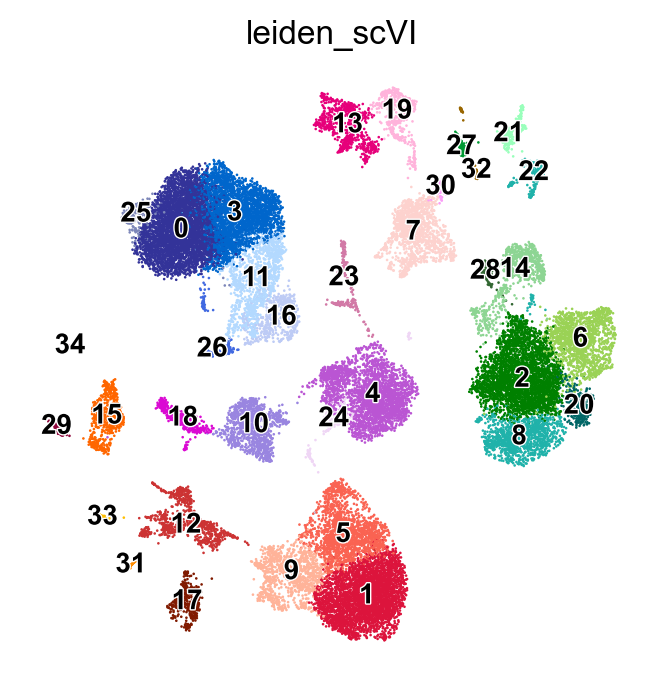

In [52]:
sc.pl.umap(adata_ctr_proc_2, color=['leiden_scVI'], legend_fontsize =float(10) , wspace=0.6, cmap=mymap2,palette=color2,legend_loc='on data',
           legend_fontweight= 'bold', frameon= False , legend_fontoutline=1, save=today+'_bbknn2_leiden.png' )

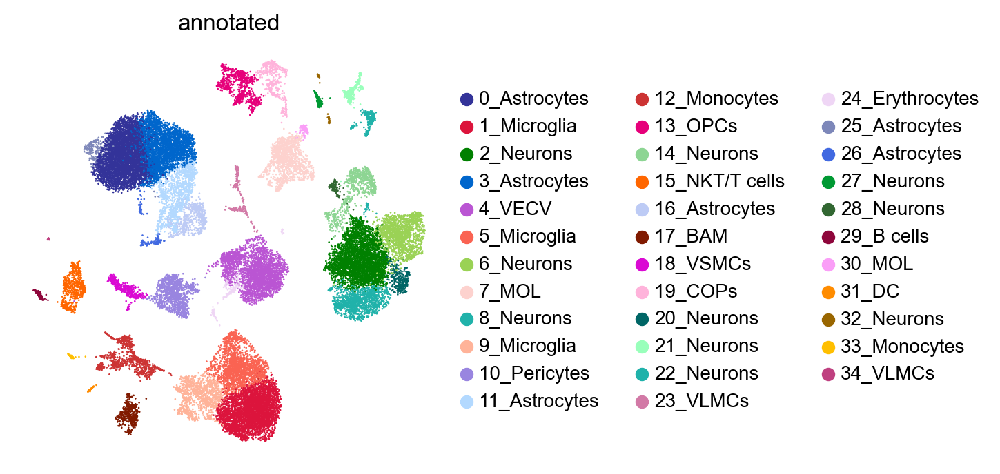

In [53]:
sc.pl.umap(adata_ctr_proc_2, color=['annotated'], legend_fontsize =float(10) , wspace=0.6, cmap=mymap2,palette=color2,
           legend_fontweight= 'bold', frameon= False , legend_fontoutline=1, save=today+'_bbknn2_leiden.png' )

In [54]:
adata_ctr_proc_2.write('/Volumes/bzb/JN/Jovica/Manuscript_CK_VS/notebooks/h5ad/'+today + "adata_ctr_proc_2_scVI.h5ad", compression='gzip') 

# Plots for figures

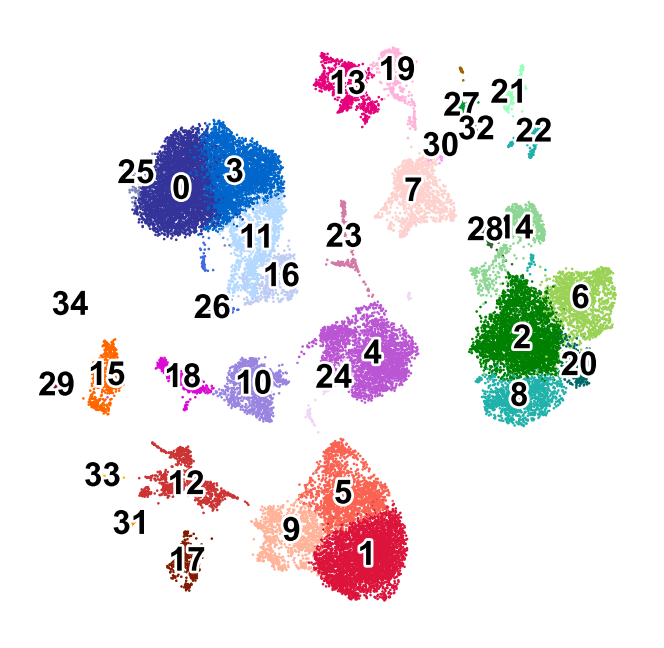

In [56]:
sc.pl.umap(adata_ctr_proc_2, color=['leiden_scVI'], legend_fontsize = float(12) , wspace=0.6, cmap=mymap2,title='',
           legend_fontweight= 'bold', frameon= False , legend_loc='on data', legend_fontoutline=2, save='_leiden_ctr.png' )

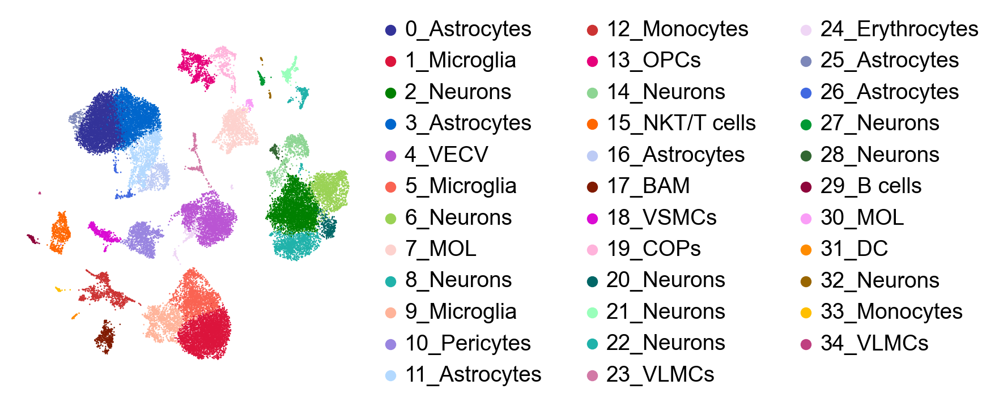

In [57]:
sc.pl.umap(adata_ctr_proc_2, color=['annotated'], legend_fontsize =float(14) , wspace=0.6, cmap=mymap2,title='',
           legend_fontweight= 'normal', frameon= False , save='_scI_annotated.png')

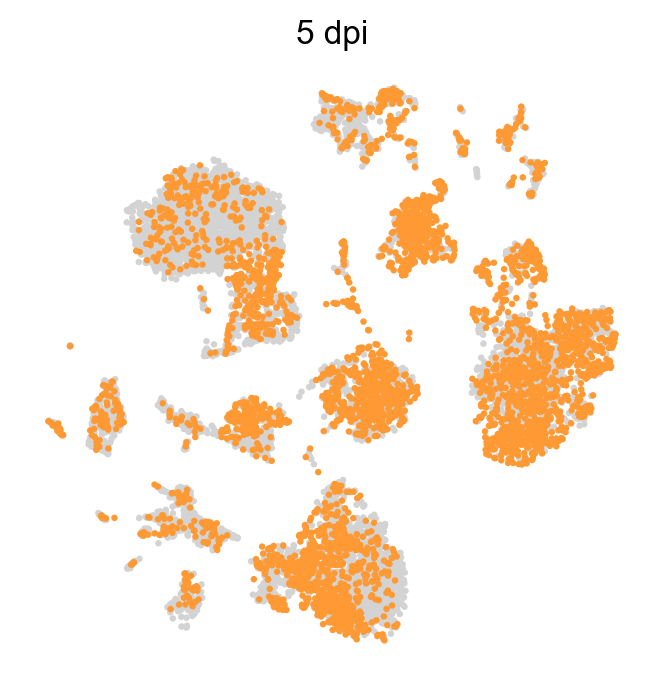

In [58]:
sc.pl.umap(adata_ctr_proc_2_subsam,color='condition', groups='5dpi_V',legend_fontsize =float(20) ,legend_loc='',title='5 dpi',size=22, frameon= False , save='_scI_5dpi.png')

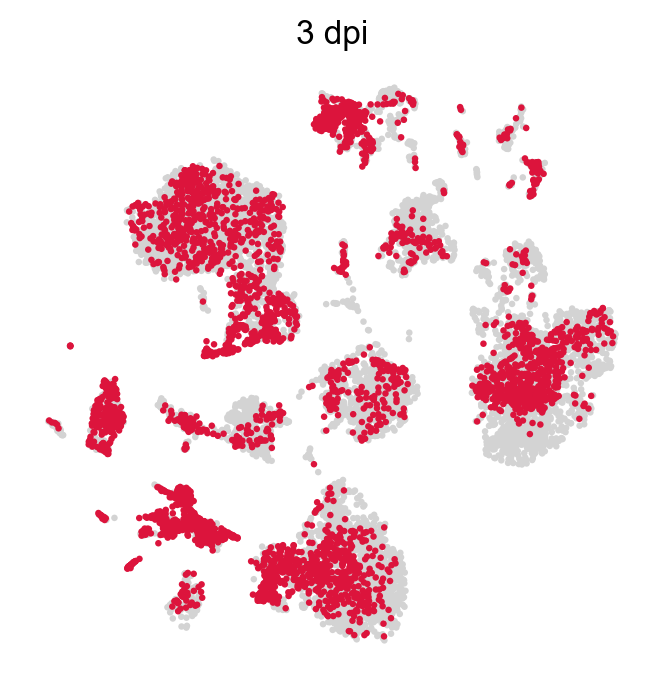

In [59]:
sc.pl.umap(adata_ctr_proc_2_subsam,color='condition', groups='3dpi_V',legend_loc='',title='3 dpi',size=22, frameon= False , save='_scI_3dpi.png')

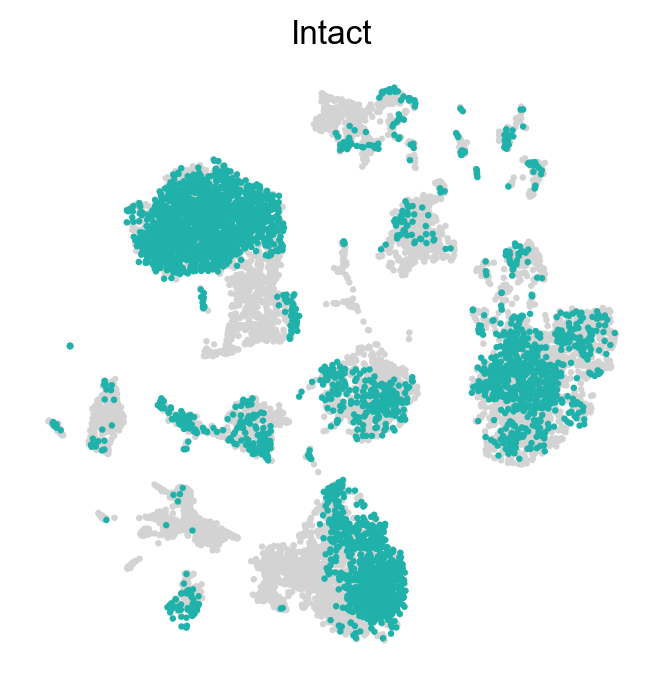

In [60]:
sc.pl.umap(adata_ctr_proc_2_subsam,color='condition', groups='Intact',  legend_loc='',title='Intact',size=22, frameon= False , save='_bbknn2_Intact.png')

In [61]:
#Calculate marker genes check for 100 use raw data for markers
sc.tl.rank_genes_groups(adata_ctr_proc_2, groupby='annotated', key_added='rank_genes_annotated', method='t-test_overestim_var', use_raw=True)

ranking genes
    finished: added to `.uns['rank_genes_annotated']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:24)


In [62]:
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=300,transparent=True, fontsize=18, color_map=mymap2)

    using 'X_pca' with n_pcs = 9
Storing dendrogram info using `.uns['dendrogram_annotated']`


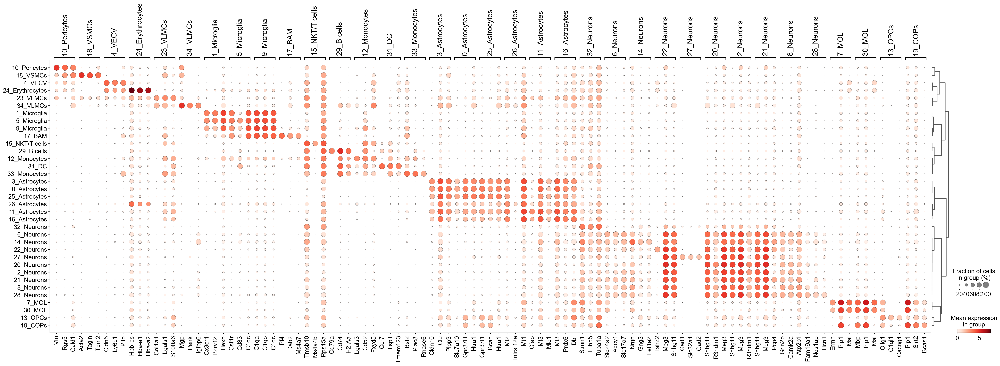

In [63]:
sc.pl.rank_genes_groups_dotplot(adata_ctr_proc_2, n_genes=3, key='rank_genes_annotated', save='_scI_annotated.png')

In [64]:
result = adata_ctr_proc_2.uns['rank_genes_annotated']
groups = result['names'].dtype.names
adata_annotated_genes = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names','scores', 'pvals','logfoldchanges']})

In [65]:
adata_annotated_genes

,0_Astrocytes_n,0_Astrocytes_s,0_Astrocytes_p,0_Astrocytes_l,1_Microglia_n,1_Microglia_s,1_Microglia_p,1_Microglia_l,2_Neurons_n,2_Neurons_s,...,32_Neurons_p,32_Neurons_l,33_Monocytes_n,33_Monocytes_s,33_Monocytes_p,33_Monocytes_l,34_VLMCs_n,34_VLMCs_s,34_VLMCs_p,34_VLMCs_l
0,Slc7a10,137.710052,0.0,4.637773,Cx3cr1,177.888062,0.0,5.986088,Snhg11,137.743118,...,7.592519e-25,3.975896,Bst2,29.922733,1.121209e-39,6.249473,Mgp,21.735809,1.139787e-18,9.461661
1,Gpr37l1,135.453506,0.0,4.745870,P2ry12,172.807480,0.0,6.172631,Meg3,130.228729,...,1.213186e-25,3.806230,Plac8,29.704893,8.335792e-47,8.887366,Penk,18.154665,7.972077e-12,10.372695
2,Htra1,135.094284,0.0,4.488080,Hexb,169.732086,0.0,6.430142,R3hdm1,111.739189,...,2.613657e-21,3.519700,Rnase6,24.202963,5.445879e-32,8.264721,Igfbp6,15.218318,6.091328e-14,6.675347
3,F3,129.327133,0.0,4.528905,Csf1r,163.060455,0.0,5.747663,Kalrn,106.528511,...,1.611347e-18,3.368714,Irf8,23.298592,5.355509e-40,5.900719,Igfbp5,14.135590,5.104498e-14,6.264814
4,Plpp3,123.558395,0.0,4.508800,Selplg,160.763199,0.0,5.815565,Camk2a,97.934837,...,3.332796e-18,3.019462,Sell,21.657927,1.015805e-30,7.680125,Fbln1,13.717649,2.672902e-12,6.540889
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19285,Junb,-52.293659,0.0,-3.907194,Prnp,-65.194832,0.0,-3.529326,Rps9,-65.903366,...,2.394150e-08,-1.467687,Glul,-7.046879,1.385209e-09,-3.675308,Mef2c,-4.015105,1.101703e-03,-4.344510
19286,Mef2c,-62.211048,0.0,-3.230517,Sepw1,-65.994705,0.0,-2.796657,Glul,-66.233543,...,2.371828e-08,-3.022721,Cd63,-7.048244,1.918036e-09,-3.855235,Tcf4,-4.021686,6.316321e-04,-2.480477
19287,Ly6e,-63.201374,0.0,-4.713518,mt-Co1,-66.846367,0.0,-1.956244,Sepp1,-66.677147,...,1.120994e-08,-1.435337,Ptn,-7.059607,1.672182e-09,-3.479979,Syt11,-4.090808,1.101737e-03,-30.498886
19288,App,-65.350433,0.0,-3.439053,Ptn,-68.046150,0.0,-3.846108,Cd63,-67.120773,...,8.336101e-09,-3.197100,Ckb,-7.682024,2.670972e-11,-2.693257,Gpm6a,-4.481155,4.700965e-04,-5.081278


In [66]:
adata_annotated_genes.to_csv(table_dir+'adata_annotated_genes.csv')

    using 'X_pca' with n_pcs = 9
Storing dendrogram info using `.uns['dendrogram_condition']`


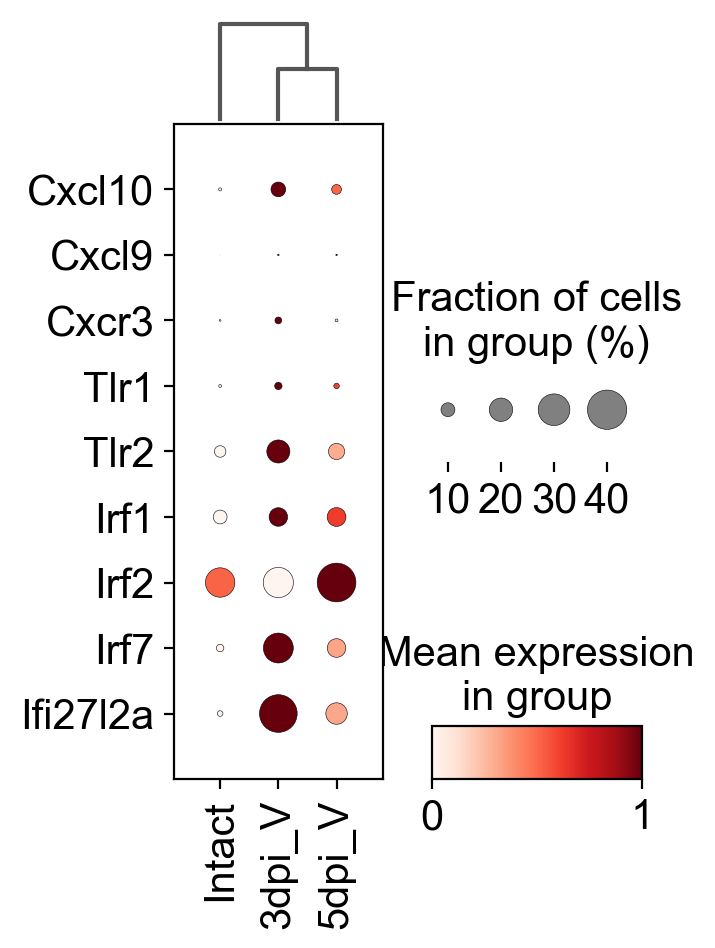

In [67]:
sc.pl.dotplot(adata_ctr_proc_2, var_names=['Cxcl10', 'Cxcl9', 'Cxcr3', 'Tlr1', 'Tlr2', 'Irf1', 'Irf2', 'Irf7', 'Ifi27l2a'], groupby='condition', swap_axes=True,standard_scale='var', dendrogram=True,figsize=(3,5), )# save='_scI_annotated.png')

In [68]:
common_innate_immunity=['Fn1', 'Anxa2', 'Top2a', 'Lgals1', 'Ifi47', 'Iigp1', 'Gm4951', 'Oas1g', 'Cxcl10', 'Oasl1',
                       'Zbp1', 'Dhx58', 'Oas1a', 'Slfn9', 'Trim25', 'Rsad2', 'Ddx60', 'Bcl3', 'Ifi27l2a', 'Oasl2', 'Irf7',
                       'Ifit1', 'Bst2', 'Isg15', 'Ifit3b', 'Ifit3','Ifitm3','Rtp4']

In [69]:
sc.tl.score_genes(adata_ctr_proc_2, common_innate_immunity, score_name='common_innate_immunity_signature')

computing score 'common_innate_immunity_signature'
    finished: added
    'common_innate_immunity_signature', score of gene set (adata.obs).
    699 total control genes are used. (0:00:01)


In [70]:
data_infmarkscore = pd.DataFrame({'condition': list(adata_ctr_proc_2.obs['condition']),
                               'cell type':list(adata_ctr_proc_2.obs['annotated']),
                               'infmark':np.array(adata_ctr_proc_2.obs['common_innate_immunity_signature'])
                              })

In [71]:
data_infmarkscore_set=data_infmarkscore.pivot_table(columns="condition", index="cell type", values="infmark")

In [72]:
data_infmarkscore_set = data_infmarkscore_set.fillna(0)

In [73]:
data_infmarkscore_ord=data_infmarkscore_set.reindex(index=['2_Neurons','6_Neurons', '8_Neurons','14_Neurons', '20_Neurons', '21_Neurons', '22_Neurons', '27_Neurons', '28_Neurons','32_Neurons',
                                                           '0_Astrocytes','3_Astrocytes', '11_Astrocytes', '16_Astrocytes', '25_Astrocytes', '26_Astrocytes',
                                                           '7_MOL', '30_MOL', '13_OPCs','19_COPs',
                                                           '4_VECV', '10_Pericytes','18_VSMCs', '23_VLMCs', '34_VLMCs','24_Erythrocytes', 
                                                           '1_Microglia','5_Microglia','9_Microglia', '12_Monocytes', '33_Monocytes','15_NKT/T cells', '17_BAM','29_B cells','31_DC'
                                                             ],
                                             columns=['Intact','3dpi_V', '5dpi_V'])

In [74]:
data_infmarkscore_ord_transposed = data_infmarkscore_ord.transpose()

In [75]:
#Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,10))
colorsComb = np.vstack([colors3, colors2])
mymapred = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

<AxesSubplot:xlabel='cell type', ylabel='condition'>

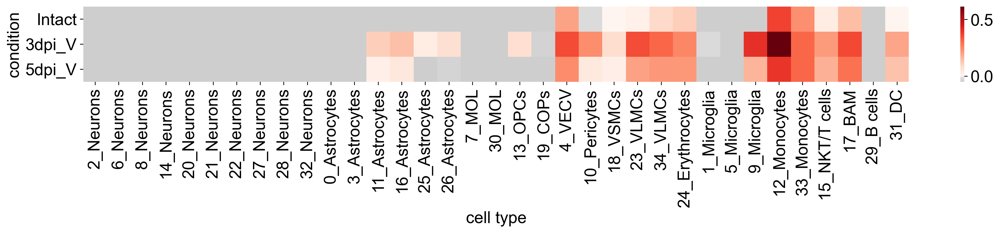

In [76]:
f, ax = plt.subplots(figsize=(20,1.5))
sb.heatmap(data_infmarkscore_ord_transposed, cmap=mymapred,annot=False, vmin=-0.05,linecolor='white')
plt.savefig('heatmap_immune_score2', dpi=300, bbox_inches = 'tight')

In [77]:
IRAS1=['Ccl2','Ccl20','Csf3','Cxcl1','Cxcl2','Cxcl3','Cxcl5','Fth1','Pdcd5','Pdlim4','Pitx3','Psme2','Serpine1','Sod2','Tnfaip6']
IRAS2=['B2m','Calr','Carhsp1','Ccl2','Cd47','Fth1','Icam1','Lap3','Nfkbia','Nnmt','Pdcd5','Pfn1','Pkm','Prelid1','Psme2','Sod2','Tmsb10','Vcam1'] #Leng et.al.2022

In [78]:
sc.tl.score_genes(adata_ctr_proc_2, IRAS1, score_name='IRAS1')

computing score 'IRAS1'
    finished: added
    'IRAS1', score of gene set (adata.obs).
    448 total control genes are used. (0:00:01)


In [79]:
sc.tl.score_genes(adata_ctr_proc_2, IRAS2, score_name='IRAS2')

computing score 'IRAS2'
    finished: added
    'IRAS2', score of gene set (adata.obs).
    348 total control genes are used. (0:00:01)


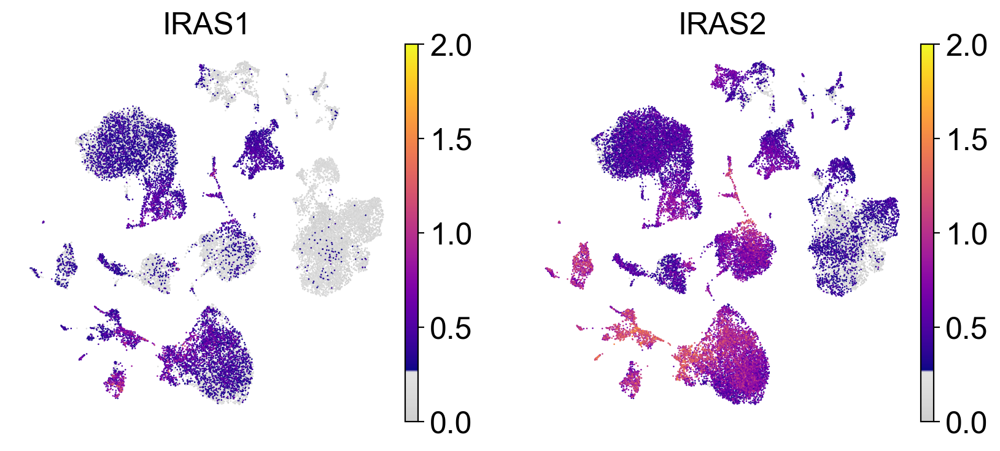

In [80]:
sc.pl.umap(adata_ctr_proc_2, color=['IRAS1', 'IRAS2'],legend_fontsize =float(12), cmap=mymap2, vmin=0, vmax=2, 
           legend_fontweight= 'normal', frameon= False , save='Lenget.al.2022.png' )

# Split cell populations

In [81]:
set(adata_ctr_proc_2.obs['annotated'])

{'0_Astrocytes',
 '10_Pericytes',
 '11_Astrocytes',
 '12_Monocytes',
 '13_OPCs',
 '14_Neurons',
 '15_NKT/T cells',
 '16_Astrocytes',
 '17_BAM',
 '18_VSMCs',
 '19_COPs',
 '1_Microglia',
 '20_Neurons',
 '21_Neurons',
 '22_Neurons',
 '23_VLMCs',
 '24_Erythrocytes',
 '25_Astrocytes',
 '26_Astrocytes',
 '27_Neurons',
 '28_Neurons',
 '29_B cells',
 '2_Neurons',
 '30_MOL',
 '31_DC',
 '32_Neurons',
 '33_Monocytes',
 '34_VLMCs',
 '3_Astrocytes',
 '4_VECV',
 '5_Microglia',
 '6_Neurons',
 '7_MOL',
 '8_Neurons',
 '9_Microglia'}

In [82]:
adata_all_astros_proc = adata_ctr_proc_2[np.in1d(adata_ctr_proc_2.obs['annotated'], 
                           ['0_Astrocytes', '3_Astrocytes','11_Astrocytes','16_Astrocytes','25_Astrocytes','26_Astrocytes'])].copy()

In [83]:
adata_all_astros_proc.write(data_dir+today+'adata_ctr_astros_proc_scVI.h5ad')

In [84]:
adata_all_oligos_proc = adata_ctr_proc_2[np.in1d(adata_ctr_proc_2.obs['annotated'], 
                           ['7_MOL', '13_OPCs','19_COPs','30_MOL'])].copy()

In [85]:
adata_all_oligos_proc.write(data_dir+today+'adata_ctr_oligos_proc_scVI.h5ad')

In [86]:
adata_all_micro_proconly = adata_ctr_proc_2[np.in1d(adata_ctr_proc_2.obs['annotated'],['1_Microglia', '5_Microglia', '9_Microglia'])].copy()

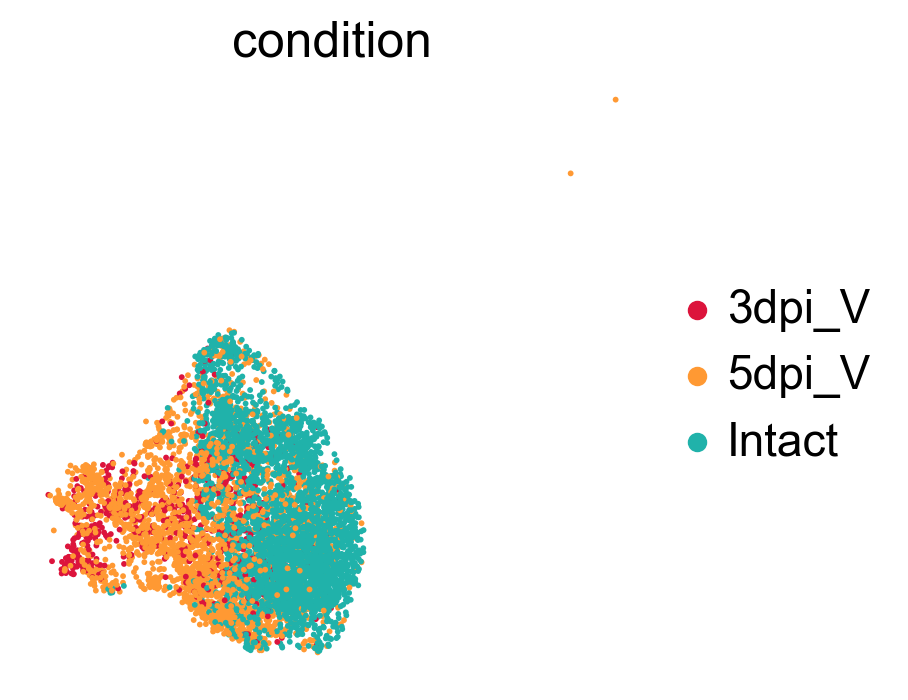

In [87]:
sc.pl.umap(adata_all_micro_proconly,color='condition',palette=con_cl, legend_fontweight= 'normal', frameon= False ,)

In [88]:
adata_all_micro_proconly.write(data_dir+today+'adata_ctr_micro_only_proc_scVI.h5ad')